#  Problem: What are the Factors and Characteristics of Listings that affect its                        Price?

In [2]:
# Importing necessary Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
%matplotlib inline
import geopandas as gpd

In [3]:
from plotly import __version__
# print(__version__)
# Requires a version of 1.9.0 or newer
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go
import chart_studio.plotly as py
import cufflinks as cf
cf.go_offline()
import plotly.express as px
init_notebook_mode(connected=False)

In [4]:
# Imports for JupyterLite
try:
    import piplite
    await piplite.install(['ipywidgets'])
except ImportError:
    pass

In [5]:
from IPython.display import display
import ipywidgets as widgets

In [6]:
def convert_dtype(x):
    if not x:
        return ''
    try:
        return str(x)   
    except:        
        return ''
df_listings = pd.read_csv('United_Kingdom_listing.csv', encoding = 'ISO-8859-1',converters={'host_response_time': convert_dtype,'district': convert_dtype})
df_listings.head()

,listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,...,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
0,281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,12/3/2011,"Paris, Ile-de-France, France",,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
1,3705183,39 mÃÂ² Paris (Sacre CÃ âur),10328771,11/29/2013,"Paris, Ile-de-France, France",,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
2,4082273,"Lovely apartment with Terrace, 60m2",19252768,7/31/2014,"Paris, Ile-de-France, France",,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
3,4797344,Cosy studio (close to Eiffel tower),10668311,12/17/2013,"Paris, Ile-de-France, France",,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4,4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,24837558,12/14/2014,"Paris, Ile-de-France, France",,NaN,NaN,f,1.0,...,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f


In [7]:
print( f"df_listings has {df_listings.shape[0]} rows and {df_listings.shape[1]} columns\n")

df_listings has 279712 rows and 33 columns



In [8]:
# Let's see the columns we have
print("df_listings columns are:")
df_listings.columns

df_listings columns are:


Index(['listing_id', 'name', 'host_id', 'host_since', 'host_location',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'district', 'city', 'latitude', 'longitude', 'property_type',
       'room_type', 'accommodates', 'bedrooms', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable'],
      dtype='object')

In [9]:
# Selecting necessary variables for further analysis
df_listings = df_listings[['listing_id', 'name', 'host_is_superhost', 'neighbourhood',
       'city', 'latitude', 'longitude', 'property_type',
       'room_type', 'accommodates', 'bedrooms', 'amenities', 'minimum_nights', 'maximum_nights', 'review_scores_accuracy', 'review_scores_communication',
       'review_scores_location', 'instant_bookable', 'price']]
df_listings.head()

,listing_id,name,host_is_superhost,neighbourhood,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,minimum_nights,maximum_nights,review_scores_accuracy,review_scores_communication,review_scores_location,instant_bookable,price
0,281420,"Beautiful Flat in le Village Montmartre, Paris",f,Buttes-Montmartre,Paris,48.88668,2.33343,Entire apartment,Entire place,2,1.0,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long...",2,1125,10.0,10.0,10.0,f,53
1,3705183,39 mÃÂ² Paris (Sacre CÃ âur),f,Buttes-Montmartre,Paris,48.88617,2.34515,Entire apartment,Entire place,2,1.0,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials""...",2,1125,10.0,10.0,10.0,f,120
2,4082273,"Lovely apartment with Terrace, 60m2",f,Elysee,Paris,48.88112,2.31712,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"",...",2,1125,10.0,10.0,10.0,f,89
3,4797344,Cosy studio (close to Eiffel tower),f,Vaugirard,Paris,48.84571,2.30584,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long ter...",2,1125,10.0,10.0,10.0,f,58
4,4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,f,Passy,Paris,48.85500,2.26979,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Ha...",2,1125,10.0,10.0,10.0,f,60


In [10]:
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279712 entries, 0 to 279711
Data columns (total 19 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   listing_id                   279712 non-null  int64  
 1   name                         279539 non-null  object 
 2   host_is_superhost            279547 non-null  object 
 3   neighbourhood                279712 non-null  object 
 4   city                         279712 non-null  object 
 5   latitude                     279712 non-null  float64
 6   longitude                    279712 non-null  float64
 7   property_type                279712 non-null  object 
 8   room_type                    279712 non-null  object 
 9   accommodates                 279712 non-null  int64  
 10  bedrooms                     250277 non-null  float64
 11  amenities                    279712 non-null  object 
 12  minimum_nights               279712 non-null  int64  
 13 

In [11]:
# Filling null values with 0
df_listings.fillna(0, inplace=True)

In [12]:
# Subset prices from df_listings into df_price
df_price = df_listings['price']
# Create an empty price list
prices=[]

# Convert prices from df_listings into float values and append it in prices list
for p in df_price:
    p = float(p)
    prices.append(p)
    
# Replace the price column in the original listingDF with the new prices
df_listings['price'] = prices

In [13]:
# Taking out listings with no price and review acuracy
df_listings = df_listings[df_listings['price'] > 0]
df_listings = df_listings[df_listings['bedrooms'] > 0]
df_listings = df_listings[df_listings['review_scores_accuracy'] > 0]
df_listings = df_listings[df_listings['minimum_nights'] > 0]
df_listings = df_listings[df_listings['maximum_nights'] > 0]
# Take out duplicates  
df_listings.drop_duplicates(subset="listing_id")
df_listings['location'] = df_listings['neighbourhood'] + ', ' + df_listings['city']
df_listings.head()

,listing_id,name,host_is_superhost,neighbourhood,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,minimum_nights,maximum_nights,review_scores_accuracy,review_scores_communication,review_scores_location,instant_bookable,price,location
0,281420,"Beautiful Flat in le Village Montmartre, Paris",f,Buttes-Montmartre,Paris,48.88668,2.33343,Entire apartment,Entire place,2,1.0,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long...",2,1125,10.0,10.0,10.0,f,53.0,"Buttes-Montmartre, Paris"
1,3705183,39 mÃÂ² Paris (Sacre CÃ âur),f,Buttes-Montmartre,Paris,48.88617,2.34515,Entire apartment,Entire place,2,1.0,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials""...",2,1125,10.0,10.0,10.0,f,120.0,"Buttes-Montmartre, Paris"
2,4082273,"Lovely apartment with Terrace, 60m2",f,Elysee,Paris,48.88112,2.31712,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"",...",2,1125,10.0,10.0,10.0,f,89.0,"Elysee, Paris"
3,4797344,Cosy studio (close to Eiffel tower),f,Vaugirard,Paris,48.84571,2.30584,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long ter...",2,1125,10.0,10.0,10.0,f,58.0,"Vaugirard, Paris"
4,4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,f,Passy,Paris,48.85500,2.26979,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Ha...",2,1125,10.0,10.0,10.0,f,60.0,"Passy, Paris"


In [14]:
print( f"df_listings now has {df_listings.shape[0]} rows and {df_listings.shape[1]} columns\n")

df_listings now has 168227 rows and 20 columns



## Analyzing Listings Characteristics

In [16]:
# plt.scatter(x=df_listings['longitude'], y=df_listings['latitude'])
# plt.rcParams["figure.figsize"] = (50,35)
# plt.show()
fig = px.density_mapbox(df_listings, lat="latitude", lon="longitude", zoom=1.5,
                       radius=2,
                       mapbox_style="stamen_terrain")
fig.show()

According to our density map we have the most listings in Europe and North America and the least of listings in South Africa. But this is broad lets narrow it down to our listings city


In [17]:
# Assign value_counts to a DataFrame
city = df_listings['city'].value_counts().to_frame()
city = city.reset_index()
# change column names
city.columns = ['city', 'counts'] 
city.iplot(kind="bar", x="city", y="counts")

From the plot above we see that most of the listings are locted in Paris, New York, Sydney and Rome, Probably due to tourist attraction 

In [29]:
print("Number of Room types: ", len(df_listings['room_type'].unique()))
print()
print("Our listings has exactly:")
rooms = df_listings['room_type'].value_counts().to_frame()
rooms = rooms.reset_index()
rooms.columns = ['rooms', 'counts'] 
rooms

Number of Room types:  4

Our listings has exactly:


0    114148
1     48334
2      3526
3      2219
Name: counts, dtype: int64

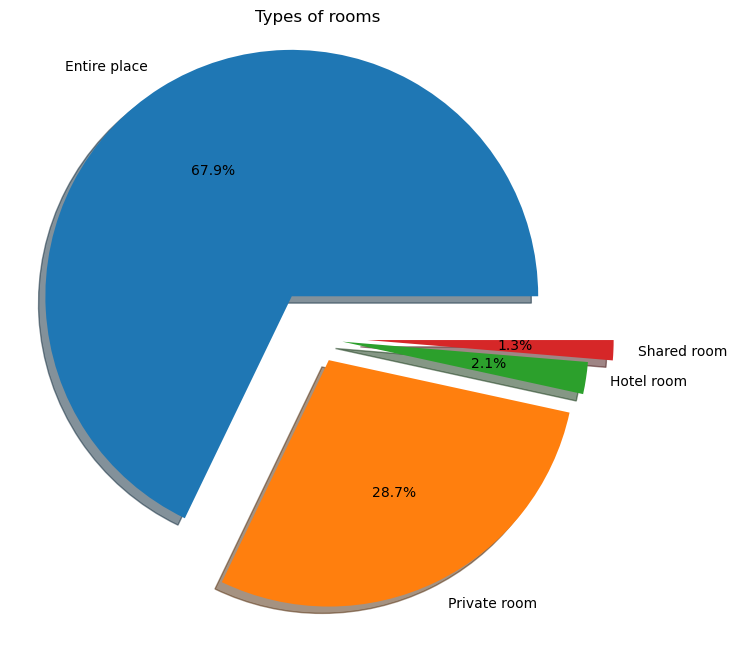

In [30]:
label = [i for i in rooms.rooms]

def func(x, rooms):
#     pct = (x*100)/room_stats.sum()
    return "{:.1f}%".format(x)
          
fig = plt.figure(figsize = (8,8))

plt.pie(rooms.counts,
       labels=label,
       autopct = lambda pct: func(pct, rooms),
       explode = [0.2, 0.1, 0.1, 0.2],
       shadow = True,)
plt.style.use('tableau-colorblind10')
plt.title("Types of rooms")
plt.show()

As it can be seen from the pie chart most of the listings are Entire places and Private rooms with shared rooms being the least

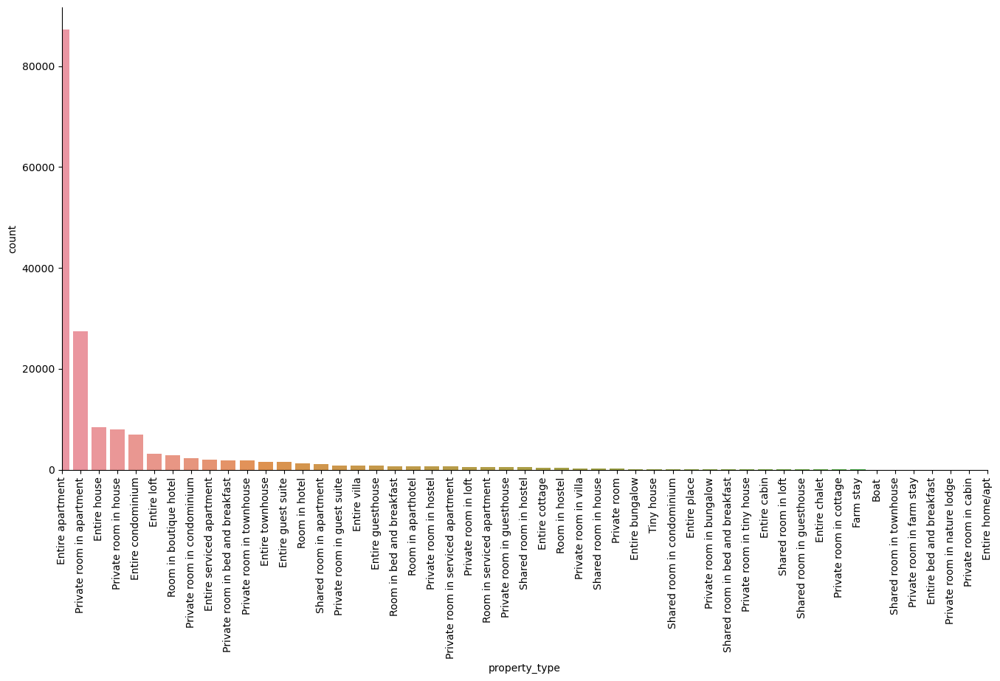

In [31]:
# Assign value_counts to a DataFrame
order = df_listings['property_type'].value_counts().to_frame()
order = order.reset_index()
# change column names
order.columns = ['Property', 'counts'] 
# order.head()
# # Order Plot by order dataframe
g = sns.catplot(x='property_type', data= df_listings, kind = "count", height=7, aspect=2, order=order['Property'])
# Showing the top 150 neighbourhoods
plt.xlim(0,50)
plt.xticks(rotation=90)
plt.show()

From the plot above we see most the listing are Entire apartments and Private rooms  which confirms our earlier discovery that host prefer to list their full apartment rather than shared rooms possibly for privacy. It can be inferred that most listings are Entire buildings or Private rooms

## Analyzing price based on Listings Characteristics
We wouldnt be doing much analysis with property type as it a variation of room type

<AxesSubplot: xlabel='room_type', ylabel='city'>

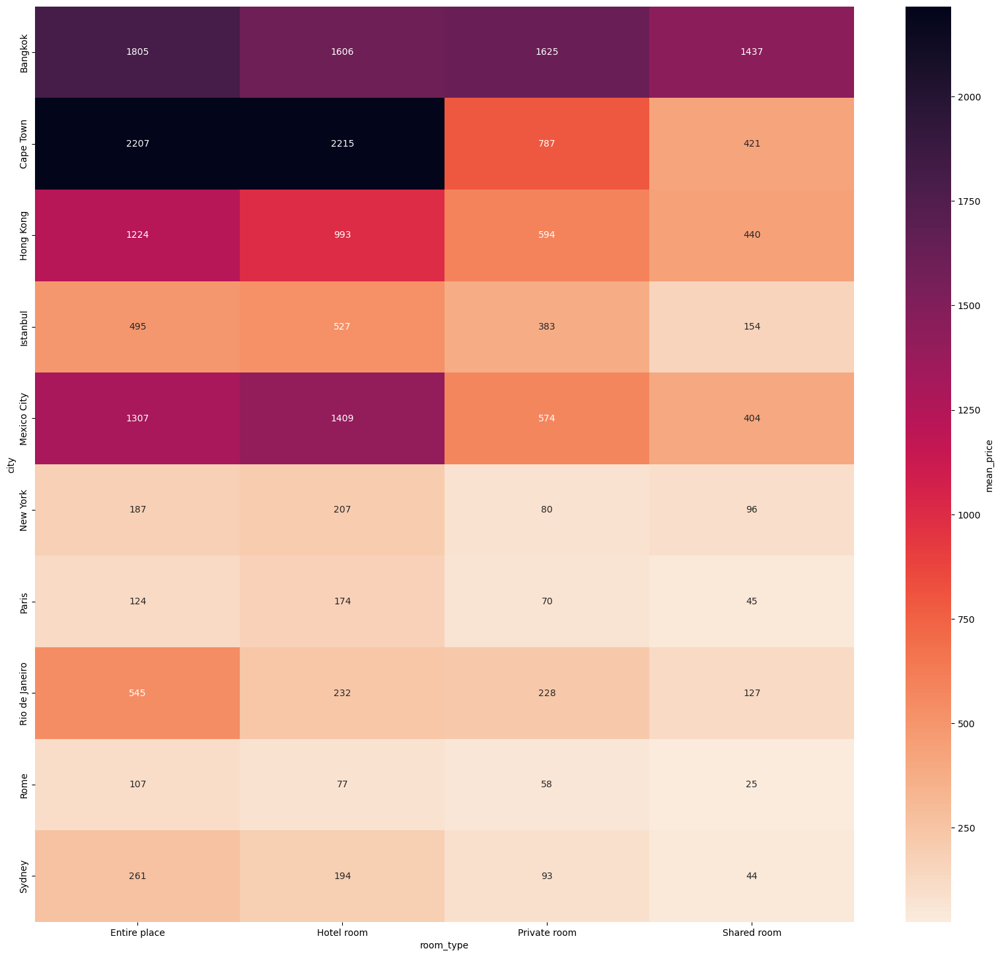

In [103]:
plt.figure(figsize = (20,18))
sns.heatmap(df_listings.groupby(['city','room_type']).price.mean().unstack(), annot=True, fmt=".0f", cmap = sns.cm.rocket_r, cbar_kws={'label': 'mean_price'})

With the lighter colour representing the cheapest and the darker colour representong the most expensive, we can see that shared room has the lightest colour and is therefore the cheapest and Entire place has the darkest colour hence it is the most expensive

It is also important to note that the top 5 most expensive rooms is not located in the top 5 most listing-populated city but rather in the bottom five.
This could mean that Listings population in a city affect the price of individual listings in the city 

In [114]:
df_listings.groupby(["city"]).price.mean().iplot(kind="bar")

The graph above confirms our theory that the the most expensive cities are not the most listing populated cities.
And listings Population affects the general price of listing in the city


In [115]:
# Checking out the mean prices for the different room and property types
df_loom_price = df_listings.groupby(['location','room_type']).price.mean()
df_loom_price = df_loom_price.reset_index()
df_loom_price = df_loom_price.sort_values('price', ascending=False)
df_loom_price = df_loom_price.sort_values('room_type')
# df_room_price

df_location_room_price  = df_loom_price.pivot_table(index="location", columns="room_type", values="price")
df_location_room_price.fillna(0, inplace=True)
df_location_room_price['mean'] = df_location_room_price.mean(axis=1)
df_location_room_price = df_location_room_price.sort_values('mean', ascending=False)
df_location_room_price = df_location_room_price.drop('mean', axis=1)

In [120]:
df_location_room_price.sum().iplot(kind='bar',xTitle='Room_Type', yTitle='Average Price')

AttributeError: 'NoneType' object has no attribute 'update_layout'

This graph shows Entire Place and Private room are both the most common and most expensive room type

In [122]:
df_radiobutton_location = df_location_room_price.reset_index()
radiobutton_location = list(df_radiobutton_location['location'][:50])
df_radiobutton_locations = df_radiobutton_location[df_radiobutton_location.location.isin(radiobutton_location)]

room_types = widgets.RadioButtons(
    options=['Entire place','Hotel room','Private room','Shared room'],
    value='Entire place', # Defaults to 'pineapple'
#    layout={'width': 'max-content'}, # If the items' names are long
    description='Room Types:',
    disabled=False
)

def bar_plot(room_types):
    sns.catplot(
        x = 'location',
        y = room_types,
        data=df_radiobutton_locations,
        kind = 'bar',
        height = 7,
        aspect= 2)
    plt.xticks(rotation=90)
    plt.show()
    
widgets.interact(bar_plot, room_types=room_types)

interactive(children=(RadioButtons(description='Room Types:', options=('Entire place', 'Hotel room', 'Private …

<function __main__.bar_plot(room_types)>

This graph shows the Average Price of Room type per Neighbourhod

<AxesSubplot: xlabel='bedrooms', ylabel='price'>

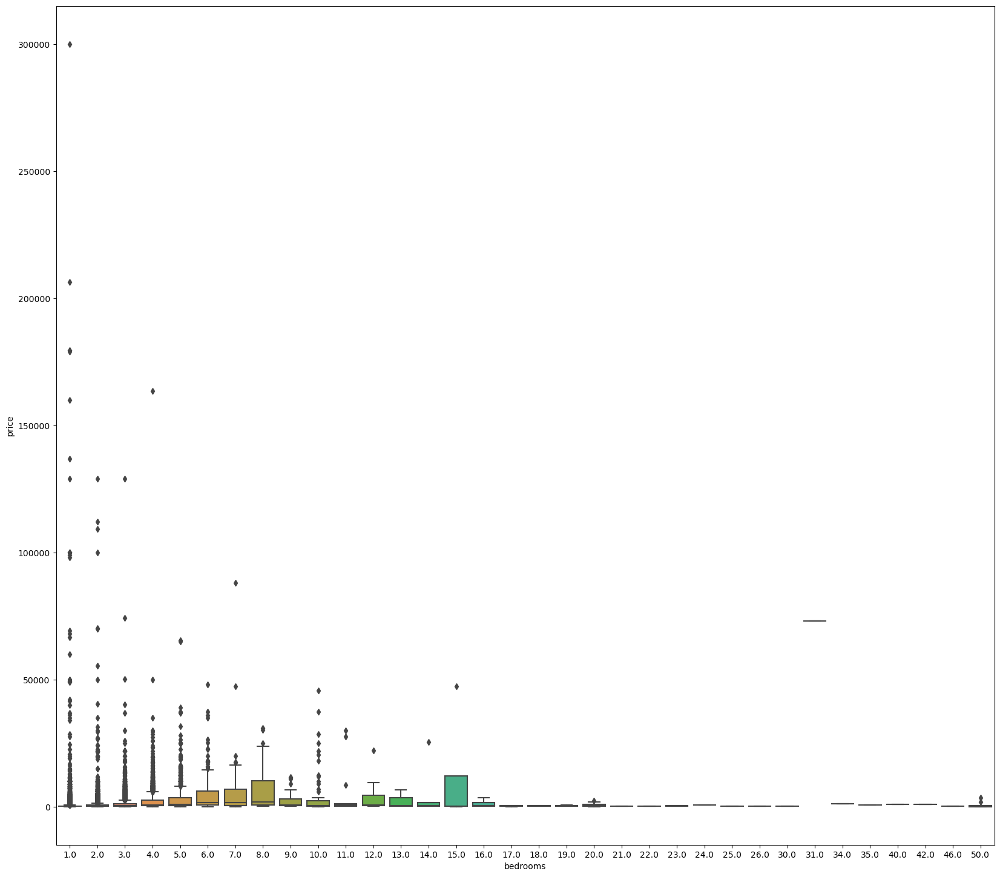

In [107]:
plt.figure(figsize = (20,18))
sns.boxplot(x='bedrooms', y='price', data=df_listings[['bedrooms', 'price']])

The above boxplot shows that thers somewhat of a relationship between no of bedrooms and the price up until 8 bedrooms
lets analyze this further.

In [132]:
bed = df_listings.groupby(["bedrooms"]).price.mean()
bed.head(10)

bedrooms
1.0      307.770917
2.0      576.037551
3.0     1024.954085
4.0     2008.148493
5.0     2944.585608
6.0     4275.829949
7.0     4887.809160
8.0     6557.546875
9.0     2420.472222
10.0    4269.294118
Name: price, dtype: float64

We see bedroom price increases as the no of bedroom increases till the 8 bedroom property

In [124]:
# Checking out the mean prices for the different bedrooms and property types
df_property_price = df_listings.groupby(['property_type','bedrooms']).price.mean()
df_property_price = df_property_price.reset_index()
df_property_price = df_property_price.sort_values('price', ascending=False)
df_property_price = df_property_price.sort_values('bedrooms')
# df_property_price

df_property_bedroom_price  = df_property_price.pivot_table(index="property_type", columns="bedrooms", values="price")
df_property_bedroom_price.fillna(0, inplace=True)
df_property_bedroom_price['mean'] = df_property_bedroom_price.mean(axis=1)
df_property_bedroom_price = df_property_bedroom_price.sort_values('mean', ascending=False)
df_property_bedroom_price = df_property_bedroom_price.drop('mean', axis=1)
# df_property_bedroom_price.head()

min_bed = df_property_price['bedrooms'].min()
max_bed = df_property_price['bedrooms'].max()


In [131]:
slider = widgets.IntSlider(
    value=1,
    min=min_bed,
    max=max_bed,
    steps=1,
    description='No of Bedrooms',
    disabled=False,
    orientation='horizontal')
# slider.value


df_property_bedroom = df_property_bedroom_price.reset_index()
slider = widgets.IntSlider(
    value=1,
    min=min_bed,
    max=max_bed,
    steps=1,
    description='No of Bedrooms',
    disabled=False,
    orientation='horizontal')

def property_plot(bedrooms):
    sns.catplot(
        x = 'property_type',
        y = bedrooms,
        data= df_property_bedroom,
        kind = 'bar',
        height = 32,
        aspect= 1)
    sns.set(font_scale=2)
    plt.xticks(rotation=90)
    plt.show()
    
widgets.interact(property_plot, bedrooms=slider)

interactive(children=(IntSlider(value=1, description='No of Bedrooms', max=50, min=1), Output()), _dom_classes…

<function __main__.property_plot(bedrooms)>

The most expensive listing is a 31 bedroom in a hotel and the least expensive listing is a 30 bedroom in aparthotel

### Analyzing if any particular ammenity results in higher prices.

In [1]:
import nltk
from nltk.corpus import stopwords
import re